# Double ML

## Case Study: Personalized Hypertension Treatment

A clinical trial is conducted with 10,000 patients to assess the effectiveness of a new medication for lowering blood pressure. Researchers collect five patient characteristics: Blood Pressure (BP), BMI, Physical Activity, and Cholesterol.

**Treatment Assignment**

The probability of receiving the new drug depends on baseline blood pressure, BMI, and cholesterol:
$$
\text{logit} = 0.05 \times \text{BP} - 0.02 \times \text{BMI} + 0.01 \times \text{Cholesterol} - 0.2
$$

Patients with higher blood pressure and cholesterol are more likely to be prescribed the medication.

**Baseline**

The baseline blood pressure after lifestyle adjustments is influenced by BP, BMI, age, and cholesterol:
$$
\text{Baseline BP} = 1.0 \times \text{Baseline} - 1.2 \times \text{BMI} + 0.7 \times \text{Age} + 0.3 \times \text{Cholesterol} 
+ 0.5 \times \text{Physical Activity}
$$


**True Treatment Effect**

The drug’s effect is **heterogeneous** and depends on baseline blood pressure:
$$
\tau_{\text{true}} = 1.0 + 0.1 \times \text{Baseline BP}
$$

Patients with higher initial blood pressure experience a stronger reduction.

## Data Generation

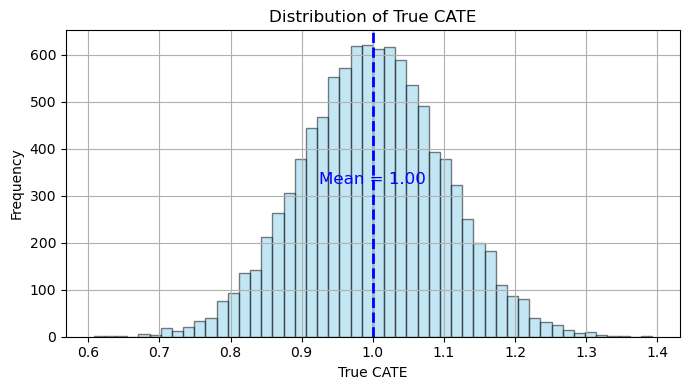

In [149]:
import numpy as np
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# -----------------------------
# Step 1: Simulate medication scenario 
# -----------------------------
rng = np.random.RandomState(42)
n = 10000

# Features
Baseline_BP = rng.normal(size=n)
BMI = rng.normal(size=n)
Age = rng.normal(size=n)
Physical_Activity = rng.normal(size=n)
Cholesterol = rng.normal(size=n)

# Treatment assignment probability
logit = 0.05*Baseline_BP - 0.02*BMI + 0.01*Cholesterol - 0.2
p_T = 1 / (1 + np.exp(-logit))
Treatment = rng.binomial(1, p_T, size=n)

# Baseline outcome
baseline = 1.0*Baseline_BP - 1.2*BMI + 0.7*Age + 0.3*Cholesterol + 0.5*Physical_Activity

# True heterogeneous treatment effect
tau_true = 1.0 + 0.1*Baseline_BP

# Outcome with noise
Outcome = baseline + tau_true*Treatment + rng.normal(scale=1.0, size=n)

# Create DataFrame
data = pd.DataFrame({
    "Baseline_BP": Baseline_BP,
    "BMI": BMI,
    "Age": Age,
    "Physical_Activity": Physical_Activity,
    "Cholesterol": Cholesterol,
    "Treatment": Treatment,
    "Outcome": Outcome,
    "True_CATE": tau_true
})

# -----------------------------
# Plot histogram of True_CATE
# -----------------------------
mean_cate = data['True_CATE'].mean()

plt.figure(figsize=(7, 4))
data['True_CATE'].hist(bins=50, color='skyblue', edgecolor='black', alpha=0.5)
plt.axvline(mean_cate, color='blue', linestyle='--', linewidth=2)
plt.text(mean_cate, plt.ylim()[1]*0.5, f"Mean = {mean_cate:.2f}", color='blue', ha='center',fontsize=12)
plt.title("Distribution of True CATE")
plt.xlabel("True CATE")
plt.ylabel("Frequency")
plt.tight_layout()

## EconML

### 1. Linear DML
- Purpose: Estimates treatment effects assuming a linear relationship between treatment and outcome after residualization.
- Use case: When you want interpretability and coefficients for heterogeneity.

In [150]:
from econml.dml import LinearDML
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

# -----------------------------
# Step 1: Prepare data
# -----------------------------
Z = data[["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]].values
Y = data["Outcome"].values
T = data["Treatment"].values

# -----------------------------
# Step 2: Define nuisance models
# -----------------------------
model_y = RandomForestRegressor(n_estimators=200, random_state=1)
model_t = RandomForestClassifier(n_estimators=200, random_state=1)

# -----------------------------
# Step 3: Initialize LinearDML estimator
# -----------------------------
dml_estimator = LinearDML(
    model_y=model_y,
    model_t=model_t,
    discrete_treatment=True,  # binary treatment
    random_state=42
)

# -----------------------------
# Step 4: Fit the estimator
# -----------------------------
dml_estimator.fit(Y, T, X=Z)

# -----------------------------
# Step 5: Estimate ATE and CATE
# -----------------------------
estimated_ate = dml_estimator.ate(X=Z)
cate_estimates = dml_estimator.effect(X=Z)

true_ate = np.mean(data["True_CATE"])

print("Estimated ATE (EconML LinearDML):", round(estimated_ate, 4))
print("True ATE (from data):", round(true_ate, 4))

# Optional: Inspect coefficients for heterogeneity
print("Final stage coefficients:", dml_estimator.coef_)

Estimated ATE (EconML LinearDML): 0.9776
True ATE (from data): 0.9998
Final stage coefficients: [ 0.11394266  0.02109445 -0.0285417   0.00578008  0.00767733]


### 2. Flexible DML
- Purpose: Flexible DML where you can specify any final stage model (e.g., Lasso, Ridge).
- Use case: When you want regularization in the final stage.

In [151]:
from econml.dml import DML
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor

est = DML(
    model_y=GradientBoostingRegressor(),
    model_t=GradientBoostingRegressor(),
    model_final=LassoCV(fit_intercept=False)
)

est.fit(Y, T, X=Z)
print("ATE:", est.ate(X=Z))


ATE: 0.9610223891883594


### 3. SparseLinearDML

- Purpose: Like LinearDML but uses Lasso for sparsity in heterogeneity terms.
- Use case: High-dimensional covariates where feature selection matters.

In [165]:
from econml.dml import SparseLinearDML

est = SparseLinearDML(discrete_treatment=True)
est.fit(Y, T, X=Z)
print("ATE:", est.ate(X=Z))
print("Selected features:", est.coef_)

ATE: 0.9848827952235437
Selected features: [ 0.11550473 -0.01276495 -0.01249603  0.00490054 -0.00601279]


In [167]:
import plotly.express as px

# Feature coefficients
coefficients = est.coef_
features = ["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]

# Create bar chart
fig = px.bar(x=features, y=coefficients,
             labels={'x': 'Features', 'y': 'Coefficient'},
             title='Feature Coefficients from SparseLinearDML',
             color=coefficients,
             color_continuous_scale='RdBu')
fig.show()

### 4. NonParamDML

- Purpose: Fully nonparametric estimation using ML models for both nuisance and final stage.
- Use case: When you want flexible modeling without assuming linearity.

In [153]:
from econml.dml import NonParamDML
from sklearn.ensemble import GradientBoostingRegressor

est = NonParamDML(
    model_y=GradientBoostingRegressor(),
    model_t=GradientBoostingRegressor(),
    model_final=GradientBoostingRegressor()
)

est.fit(Y, T, X=Z)
print("ATE:", est.ate(X=Z))

ATE: 0.983080838554681


### 5. CausalForestDML

- Purpose: Uses causal forests for heterogeneous treatment effects.
- Use case: When you want individual-level CATE estimates and confidence intervals.

In [154]:
from econml.dml import CausalForestDML
from sklearn.ensemble import GradientBoostingRegressor

est = CausalForestDML(
    model_y=GradientBoostingRegressor(),
    model_t=GradientBoostingRegressor(),
    discrete_treatment=True,
    random_state=42
)

est.fit(Y, T, X=Z)
point = est.effect(Z)  # CATE estimates
lb, ub = est.effect_interval(Z, alpha=0.05)  # Confidence intervals
print("CATE of the first five records:", point[:5])
print("95% CI:", list(zip(lb[:5], ub[:5])))


/opt/anaconda3/envs/py311/lib/python3.11/site-packages/econml/dml/dml.py:51: UserWarning:

First stage model has discrete target but model is not a classifier!

/opt/anaconda3/envs/py311/lib/python3.11/site-packages/econml/dml/dml.py:51: UserWarning:

First stage model has discrete target but model is not a classifier!



CATE: [0.8813452  0.97378645 1.11550977 1.17599781 1.09698432]
95% CI: [(0.5643573955876084, 1.198332998893398), (0.5528548437665424, 1.3947180596303346), (0.8319898217130445, 1.3990297152498081), (0.6398031088127003, 1.7121925079570857), (0.6938132064308155, 1.500155441557336)]


### Summary Table

| Estimator         | Final Stage | Heterogeneity | Parametric? |
| ----------------- | ----------- | ------------- | ----------- |
| `LinearDML`       | Linear      | Yes           | Yes         |
| `DML`             | Custom      | Yes           | Depends     |
| `SparseLinearDML` | Linear      | Yes (Sparse)  | Yes         |
| `NonParamDML`     | ML          | Yes           | No          |
| `CausalForestDML` | Forest      | Yes           | No          |

## Meta-learners + DML

In [155]:
import numpy as np
import pandas as pd
import plotly.express as px
from econml.metalearners import TLearner, SLearner, XLearner
from econml.dml import LinearDML, CausalForestDML
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier, RandomForestRegressor, RandomForestClassifier

# -----------------------------
# Step 1: Prepare data
# -----------------------------
Z = data[["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]].values
Y = data["Outcome"].values
T = data["Treatment"].values

# -----------------------------
# Step 2: Meta-Learners
# -----------------------------
t_learner = TLearner(models=GradientBoostingRegressor())
t_learner.fit(Y, T, X=Z)
cate_t = t_learner.effect(Z)

s_learner = SLearner(overall_model=GradientBoostingRegressor())
s_learner.fit(Y, T, X=Z)
cate_s = s_learner.effect(Z)

x_learner = XLearner(models=GradientBoostingRegressor())
x_learner.fit(Y, T, X=Z)
cate_x = x_learner.effect(Z)

# -----------------------------
# Step 3: DML Estimators
# -----------------------------
linear_dml = LinearDML(
    model_y=RandomForestRegressor(n_estimators=200),
    model_t=RandomForestClassifier(n_estimators=200),  
    discrete_treatment=True,
    random_state=42
)
linear_dml.fit(Y, T, X=Z)
ate_linear_dml = linear_dml.ate(X=Z)
cate_linear_dml = linear_dml.effect(Z)

cf_dml = CausalForestDML(
    model_y=GradientBoostingRegressor(),
    model_t=GradientBoostingClassifier(),  
    discrete_treatment=True,
    random_state=42
)
cf_dml.fit(Y, T, X=Z)
ate_cf_dml = cf_dml.ate(X=Z)
cate_cf_dml = cf_dml.effect(Z)

# -----------------------------
# Step 4: Compute ATE for Meta-Learners
# -----------------------------
ate_t = np.mean(cate_t)
ate_s = np.mean(cate_s)
ate_x = np.mean(cate_x)
true_ate = np.mean(true_cate)

# -----------------------------
# Step 5: Create comparison DataFrame
# -----------------------------
results_df = pd.DataFrame({
    "Method": ["T-Learner", "S-Learner", "X-Learner", "LinearDML", "CausalForestDML"],
    "ATE": [ate_t, ate_s, ate_x, ate_linear_dml, ate_cf_dml]
})
print("\n===== ATE Comparison =====")
print("True ATE:", round(true_ate, 4))
print(results_df)

# -----------------------------
# Visualization 1: Bar chart of ATE estimates
# -----------------------------
fig1 = px.bar(results_df, x="Method", y="ATE", title="Comparison of ATE Estimates", text="ATE")
fig1.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig1.show()

# -----------------------------
# Visualization 2: CATE vs Age for all methods
# -----------------------------
cate_df = pd.DataFrame({
    "Age": data["Age"],
    "True_CATE": true_cate,
    "T-Learner": cate_t,
    "S-Learner": cate_s,
    "X-Learner": cate_x,
    "LinearDML": cate_linear_dml,
    "CausalForestDML": cate_cf_dml
})
cate_melted = cate_df.melt(id_vars="Age", var_name="Method", value_name="CATE")
fig2 = px.scatter(cate_melted, x="Age", y="CATE", color="Method", title="CATE vs Age by Method", opacity=0.6)
fig2.show()


===== ATE Comparison =====
True ATE: 0.9998
            Method       ATE
0        T-Learner  0.983841
1        S-Learner  0.901101
2        X-Learner  0.983003
3        LinearDML  0.982584
4  CausalForestDML  0.979681


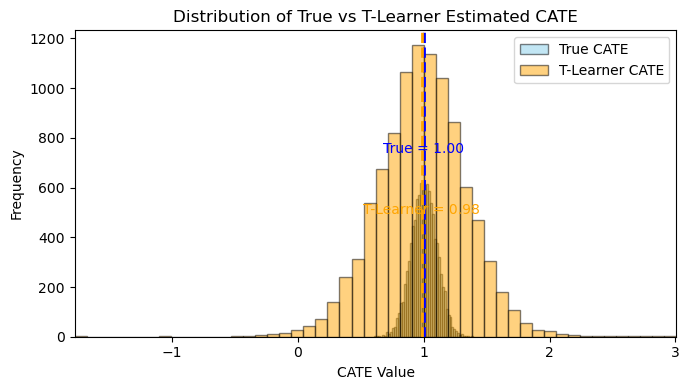

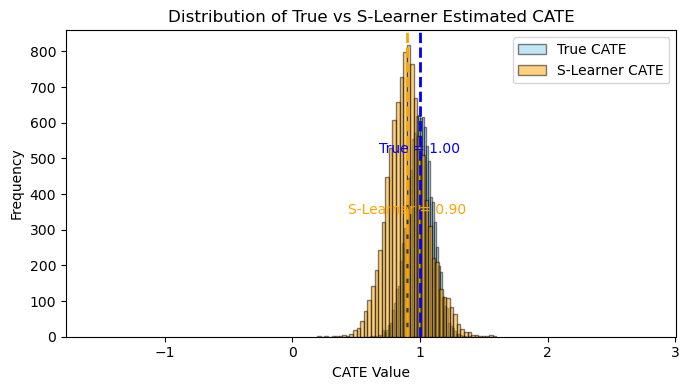

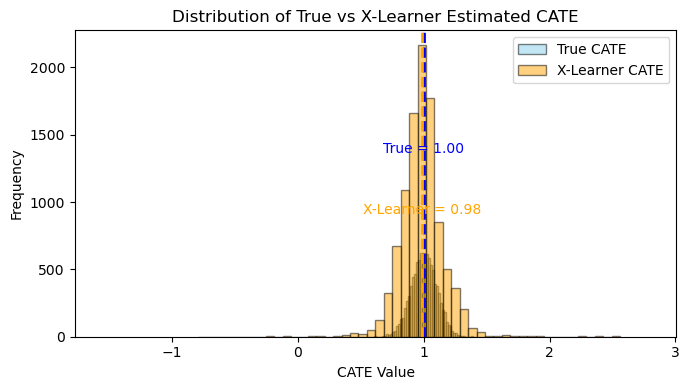

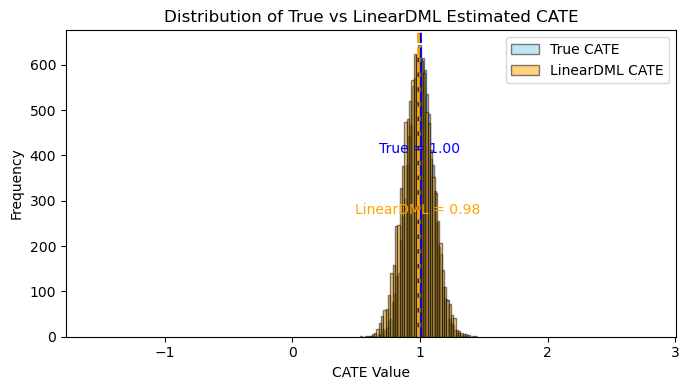

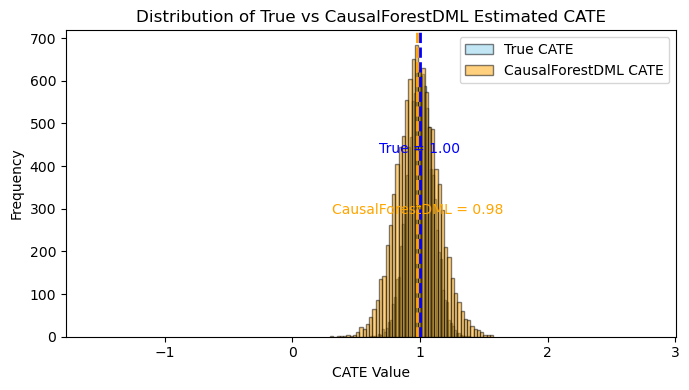

In [156]:
true_cate = cate_df['True_CATE']
methods = ["T-Learner", "S-Learner", "X-Learner", "LinearDML", "CausalForestDML"]

# Determine global min and max for x-axis limits
all_values = pd.concat([true_cate] + [cate_df[m] for m in methods])
global_min, global_max = all_values.min(), all_values.max()

# Loop through each method and create individual plots with consistent x-limits
for method in methods:
    estimated_cate = cate_df[method]
    mean_true = true_cate.mean()
    mean_estimated = estimated_cate.mean()

    plt.figure(figsize=(7, 4))
    plt.hist(true_cate, bins=50, color='skyblue', edgecolor='black', alpha=0.5, label='True CATE')
    plt.hist(estimated_cate, bins=50, color='orange', edgecolor='black', alpha=0.5, label=f'{method} CATE')

    # Add vertical lines for means
    plt.axvline(mean_true, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_estimated, color='orange', linestyle='--', linewidth=2)

    # Annotate means
    plt.text(mean_true, plt.ylim()[1]*0.6, f"True = {mean_true:.2f}", color='blue', ha='center', fontsize=10)
    plt.text(mean_estimated, plt.ylim()[1]*0.4, f"{method} = {mean_estimated:.2f}", color='orange', ha='center', fontsize=10)

    # Titles and labels
    plt.title(f"Distribution of True vs {method} Estimated CATE")
    plt.xlabel("CATE Value")
    plt.ylabel("Frequency")
    plt.xlim(global_min, global_max)  # ✅ consistent x-axis limits
    plt.legend()
    plt.tight_layout()

    # Save each plot
    filename = f"cate_distribution_{method.replace(' ', '_').lower()}_fixed_xlim.png"
    plt.show()
    plt.close()


## Perform DML Manually without using econML

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
import statsmodels.api as sm

# -----------------------------
# Step 2: Prepare data for DML
# -----------------------------
Z = data[["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]].values
Y = data["Outcome"].values
T = data["Treatment"].values

Z_train, Z_test, Y_train, Y_test, T_train, T_test = train_test_split(
    Z, Y, T, test_size=0.5, random_state=42
)

# -----------------------------
# Step 3: First-stage outcome models
# -----------------------------
outcome_model_A = RandomForestRegressor(n_estimators=200, random_state=1)
outcome_model_A.fit(Z_train, Y_train)
y_hat_test = outcome_model_A.predict(Z_test)

outcome_model_B = RandomForestRegressor(n_estimators=200, random_state=2)
outcome_model_B.fit(Z_test, Y_test)
y_hat_train = outcome_model_B.predict(Z_train)

y_hat = np.empty_like(Y)
y_hat[:len(Y_train)] = y_hat_train
y_hat[len(Y_train):] = y_hat_test

# -----------------------------
# Step 4: First-stage treatment models
# -----------------------------
treatment_model_A = RandomForestClassifier(n_estimators=200, random_state=1)
treatment_model_A.fit(Z_train, T_train)
t_hat_test = treatment_model_A.predict_proba(Z_test)[:, 1]

treatment_model_B = RandomForestClassifier(n_estimators=200, random_state=2)
treatment_model_B.fit(Z_test, T_test)
t_hat_train = treatment_model_B.predict_proba(Z_train)[:, 1]

t_hat = np.empty_like(T, dtype=float)
t_hat[:len(T_train)] = t_hat_train
t_hat[len(T_train):] = t_hat_test

# -----------------------------
# Step 5: Residualization
# -----------------------------
Y_resid = Y - y_hat
T_resid = T - t_hat

# -----------------------------
# Step 6: Final regression (residual-on-residual)
# -----------------------------
X_final = sm.add_constant(T_resid)
final_model = sm.OLS(Y_resid, X_final).fit(cov_type="HC1")

# Estimated ATE from DML
estimated_ate = final_model.params[1]

# Compute true ATE from simulated data
true_ate = np.mean(data["True_CATE"])

print("Estimated Treatment Effect (DML):", round(estimated_ate, 4))
print("True ATE (from data):", round(true_ate, 4))
print(final_model.summary())


Estimated Treatment Effect (DML): 0.9939
True ATE (from data): 0.9998
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     334.5
Date:                Sat, 29 Nov 2025   Prob (F-statistic):           1.61e-73
Time:                        17:04:58   Log-Likelihood:                -24333.
No. Observations:               10000   AIC:                         4.867e+04
Df Residuals:                    9998   BIC:                         4.868e+04
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------

In [158]:
# -----------------------------
# Step 2: Prepare data for DML
# -----------------------------
Z = data[["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]].values
Y = data["Outcome"].values
T = data["Treatment"].values

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

Z_train, Z_test, Y_train, Y_test, T_train, T_test = train_test_split(
    Z, Y, T, test_size=0.5, random_state=42
)

# -----------------------------
# Step 3: First-stage outcome models
# -----------------------------
outcome_model_A = RandomForestRegressor(n_estimators=500, random_state=1)
outcome_model_A.fit(Z_train, Y_train)
y_hat_test = outcome_model_A.predict(Z_test)

outcome_model_B = RandomForestRegressor(n_estimators=500, random_state=2)
outcome_model_B.fit(Z_test, Y_test)
y_hat_train = outcome_model_B.predict(Z_train)

y_hat = np.empty_like(Y)
y_hat[:len(Y_train)] = y_hat_train
y_hat[len(Y_train):] = y_hat_test

# -----------------------------
# Step 4: First-stage treatment models
# -----------------------------
treatment_model_A = RandomForestClassifier(n_estimators=500, random_state=1)
treatment_model_A.fit(Z_train, T_train)
t_hat_test = treatment_model_A.predict_proba(Z_test)[:, 1]

treatment_model_B = RandomForestClassifier(n_estimators=500, random_state=2)
treatment_model_B.fit(Z_test, T_test)
t_hat_train = treatment_model_B.predict_proba(Z_train)[:, 1]

t_hat = np.empty_like(T, dtype=float)
t_hat[:len(T_train)] = t_hat_train
t_hat[len(T_train):] = t_hat_test

# -----------------------------
# Step 5: Residualization
# -----------------------------
Y_resid = Y - y_hat
T_resid = T - t_hat

# -----------------------------
# Step 6: Final regression (residual-on-residual)
# -----------------------------
X_final = sm.add_constant(T_resid)
final_model = sm.OLS(Y_resid, X_final).fit(cov_type="HC1")

estimated_ate = final_model.params[1]
true_ate = np.mean(data["True_CATE"])

print("Estimated Treatment Effect (DML):", round(estimated_ate, 4))
print("True ATE (from data):", round(true_ate, 4))

Estimated Treatment Effect (DML): 0.9928
True ATE (from data): 0.9998


In [159]:
# -----------------------------
# Step 6: Final regression with interaction terms
# -----------------------------
# We'll interact T_resid with the original covariates Z to allow heterogeneous effects
Z_original = data[["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]]

# Create interaction terms: T_resid * each covariate
interaction_terms = Z_original.multiply(T_resid, axis=0)
interaction_terms.columns = [f"T_x_{col}" for col in Z_original.columns]

# Combine T_resid, interactions, and constant
X_final = pd.concat([pd.Series(T_resid, name="T_resid"), interaction_terms], axis=1)
X_final = sm.add_constant(X_final)

# Fit OLS
final_model = sm.OLS(Y_resid, X_final).fit(cov_type="HC1")

print(final_model.summary())

# Extract main treatment effect and interactions
estimated_main_effect = final_model.params["T_resid"]
print("Estimated Main Treatment Effect:", round(estimated_main_effect, 4))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     56.50
Date:                Sat, 29 Nov 2025   Prob (F-statistic):           5.50e-69
Time:                        17:05:26   Log-Likelihood:                -24322.
No. Observations:               10000   AIC:                         4.866e+04
Df Residuals:                    9993   BIC:                         4.871e+04
Df Model:                           6                                         
Covariance Type:                  HC1                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.00

In [160]:
# -----------------------------
# CATE Estimation using RandomForest on residuals
# -----------------------------
X_for_cate = np.column_stack([T_resid, Z])
cate_model = RandomForestRegressor(n_estimators=100, random_state=42)
cate_model.fit(X_for_cate, Y_resid)

cate_estimates = []
for i in range(len(Z)):
    Z_i = Z[i]
    treated_pred = cate_model.predict([[1 - np.mean(T), *Z_i]])
    control_pred = cate_model.predict([[0 - np.mean(T), *Z_i]])
    cate_estimates.append(treated_pred[0] - control_pred[0])

results_df = pd.DataFrame({
    'Age': data['Age'],
    'BMI': data['BMI'],
    'Estimated_CATE': cate_estimates,
    'True_CATE': data['True_CATE']
})

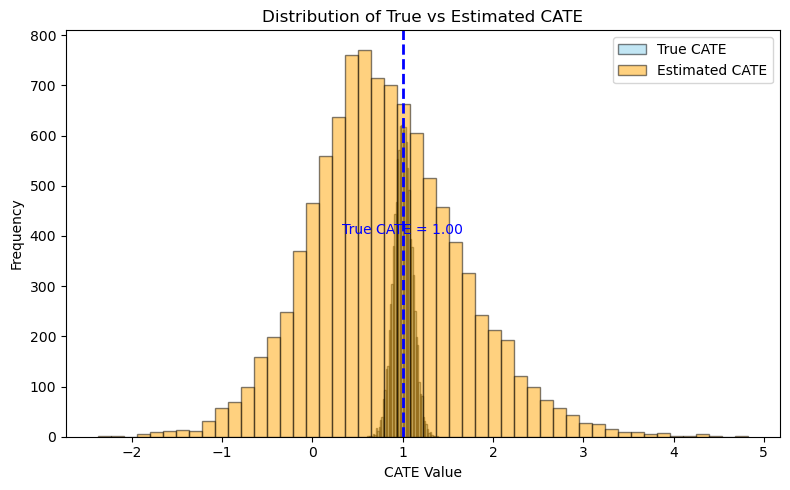

In [161]:
true_cate = results_df['True_CATE']
estimated_cate = results_df['Estimated_CATE']

# Calculate means
mean_true = true_cate.mean()
mean_estimated = estimated_cate.mean()

# Plot combined histogram
plt.figure(figsize=(8, 5))
plt.hist(true_cate, bins=50, color='skyblue', edgecolor='black', alpha=0.5, label='True CATE')
plt.hist(estimated_cate, bins=50, color='orange', edgecolor='black', alpha=0.5, label='Estimated CATE')

# Add vertical lines for means
plt.axvline(mean_true, color='blue', linestyle='--', linewidth=2)

# Annotate means
plt.text(mean_true, plt.ylim()[1]*0.5, f"True CATE = {mean_true:.2f}", color='blue', ha='center', fontsize=10)

# Titles and labels
plt.title("Distribution of True vs Estimated CATE")
plt.xlabel("CATE Value")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()

**Notes:**
- The **R² being low** in the final regression is expected and not a problem in this context.
- The final regression in Double Machine Learning (DML) is **residual-on-residual**. The residuals contain **very little variance**, and the regression only captures the treatment effect, not the full outcome model.

- Does it matter? No. This is because the goal of this regression is not prediction but **estimating the treatment effect**.
*   The coefficient on $T_{\text{resid}}$ is the **ATE estimate**, and its significance and confidence interval matter—not the R².

## How does DoWhy handle this problem?

In [163]:
import numpy as np
import pandas as pd
from dowhy import CausalModel

# -----------------------------
# Step 2: Create Causal Model
# -----------------------------
model = CausalModel(
    data=data,
    treatment="Treatment",
    outcome="Outcome",
    common_causes=["Baseline_BP", "BMI", "Age", "Physical_Activity", "Cholesterol"]
)

# -----------------------------
# Step 3: Identify effect
# -----------------------------
identified_estimand = model.identify_effect()

# -----------------------------
# Step 4: Estimate effect using linear regression
# -----------------------------
estimate = model.estimate_effect(
    identified_estimand,
    method_name="backdoor.linear_regression"
)

print("\nDoWhy estimated ATE (linear regression):", estimate.value)

# Optional: Refute the estimate
refute = model.refute_estimate(identified_estimand, estimate, method_name="placebo_treatment_refuter")
print("\nRefutation result:", refute)



DoWhy estimated ATE (linear regression): 0.985540468357224

Refutation result: Refute: Use a Placebo Treatment
Estimated effect:0.985540468357224
New effect:0.0021043227028618573
p value:0.8600000000000001

